# Does Brampton have enough Parks?

####  Background  
Brampton is experiencing large population growth, leading to an urban sprawl to house the incoming citizens. This presents the need for more community parks and open spaces as tools for better mental health and physical activity opportunities. 

#### The Demand 
Evidence is abundant that obesity and living in the suburbs are linked (Oregon State University, 2005). Further, rates of being overweight and obese in the Peel Region are higher than in the rest of the Greater Toronto Area. Another interesting fact is that In the Peel Region, the majority of neighborhoods with high rates of diabetes are located in Brampton. (Glazier, et al., 2014)

Parks seem to also be important for mental health. And, “Mental health is significantly related to residential distance from parks”. (Sturm & Cohen, 2014)

#### Interest
This project can be used to inform City of Brampton planners, more specifically the Planning & Development team of city hall. The goal is to inform these planners about the need for more parks for the people of the city and where specifically the need is the greatest. 

Taking all the above into consideration, building many parks and building them in targeted locations can have a tremendous positive impact. 


In [1]:
import pandas as pd
import numpy as np
import os 
import math

There were two main datasets used in the analysis of this project.

In [2]:
parks_df = pd.read_csv("Data/parks.csv") # (City of Brampton, 2020)
# data retrieved from  Brampton's Open Data on geohub
# https://geohub.brampton.ca/datasets/parks

In [3]:
parks_df.head()

,PARK_NAME,PARK_STATUS,PARK_TYPE,SUB_TYPE,AREA_HECTARES,EXISTING_PARK_NO,CONSTRUCTED_YEAR,ACCESS_POINTS,COMPKEY,OBJECTID,Shape__Area,Shape__Length
0,THATCHER PARKETTE,ACTIVE,NEIGHBOURHOOD PARKS,VEST POCKET,0.067,154,1980.0,"THATCHER CRT, MONDRAGON CIR",138737.0,1,1278.929688,159.984939
1,KINDLE PARKETTE,ACTIVE,NEIGHBOURHOOD PARKS,VEST POCKET,0.173,138,1980.0,"KINDLE CRT, ELMVALE AVE",138361.0,2,3321.097656,334.178668
2,SUNCREST PARKETTE,ACTIVE,NEIGHBOURHOOD PARKS,VEST POCKET,0.370,83,1998.0,"SUNCREST DR, RED MAPLE DR",138724.0,3,7057.964844,342.378607
3,JORGEN JENSEN PARKETTE,ACTIVE,NEIGHBOURHOOD PARKS,VEST POCKET,0.091,214,1980.0,"COURTLEIGH SQ, SANDALWOOD PKY E, KENNEDY RD N",138348.0,4,1735.496094,178.142569
4,CONESTOGA PARKETTE,ACTIVE,NEIGHBOURHOOD PARKS,PARKETTE,0.098,127,1980.0,"CONESTOGA DR, FANSHAWE DR",138135.0,5,1871.015625,179.193901


In [4]:
parks_df["PARK_STATUS"].value_counts()
# All PARK_STATUS values are ACTIVE

ACTIVE    839
Name: PARK_STATUS, dtype: int64

In [5]:
#removing redundant columns
parks_df.drop(axis = 1, labels = ["PARK_STATUS", "EXISTING_PARK_NO", "CONSTRUCTED_YEAR", "COMPKEY", "OBJECTID", "Shape__Area", "Shape__Length"], inplace = True)
parks_df.head()

,PARK_NAME,PARK_TYPE,SUB_TYPE,AREA_HECTARES,ACCESS_POINTS
0,THATCHER PARKETTE,NEIGHBOURHOOD PARKS,VEST POCKET,0.067,"THATCHER CRT, MONDRAGON CIR"
1,KINDLE PARKETTE,NEIGHBOURHOOD PARKS,VEST POCKET,0.173,"KINDLE CRT, ELMVALE AVE"
2,SUNCREST PARKETTE,NEIGHBOURHOOD PARKS,VEST POCKET,0.370,"SUNCREST DR, RED MAPLE DR"
3,JORGEN JENSEN PARKETTE,NEIGHBOURHOOD PARKS,VEST POCKET,0.091,"COURTLEIGH SQ, SANDALWOOD PKY E, KENNEDY RD N"
4,CONESTOGA PARKETTE,NEIGHBOURHOOD PARKS,PARKETTE,0.098,"CONESTOGA DR, FANSHAWE DR"


In [6]:
parks_df["PARK_TYPE"].value_counts()

NEIGHBOURHOOD PARKS                                    345
ENVIRONMENTAL PARKS                                    293
STORMWATER MANAGEMENT PONDS                            114
COMMUNITY PARKS                                         39
CITY PARKS                                              17
CONSERVATION AUTHORITY-OWNED LANDS(CITY MAINTAINED)     13
CONSERVATION AUTHORITY-OWNED LANDS                       8
OPERATIONS/ADMINISTRATION FACILITIES                     7
LEASED RECREATION FACILITY LANDS                         3
Name: PARK_TYPE, dtype: int64

In [7]:
parks_df.to_csv('Data/parks_to_find_coordinates.csv')

I needed to know the location of each park for the analysis in this project. I had to manually go through each park and determine the coordinates using Google Maps. This was done to filter out parks that I thought should not be included in the analysis (there were many). I found that it was difficult to find the coordinates of each park using Google's geocoding API due to the fact that the park names were not consistently registered in Google Maps. In addition, I found Brampton's GeoHub platform very difficult to work with. In general, I first used the ACCESS_POINTS column to find the parks with Google Maps satellite view and then determined if a park was present there. If in the end a park was not found then that park was removed from consideration. Sometimes I found that the "park" that I was looking for was just a small patch of grass or a very small path connecting a smaller street to a road that shouldn't qualify as a park. I removed these as well. The PARK_TYPE classifications were inconsistent and usually did not aid in determining whether or not a given park fits the mandate of this project.

In [8]:
parks_df = pd.read_csv('Data/parks_with_coordinates.csv')

In [9]:
parks_df.head()

,PARK_NAME,AREA_HECTARES,Latitude,Longitude
0,SUNCREST PARKETTE,0.370,43.693096,-79.790422
1,JORGEN JENSEN PARKETTE,0.091,43.727332,-79.791506
2,RC CHARLTON PARK,0.791,43.647689,-79.760273
3,PICKARD PARK,1.344,43.681801,-79.797636
4,GARBUTT PARKETTE,0.178,43.669562,-79.781612


In [10]:
parks_df.shape

(716, 4)

Of the 839 parks I went through, I could either not find or discounted 123 "parks". 

There were many examples of so called "parks" that I found should not qualify for my list, even if some of them may have fit the loose definition of park. Here are a few examples of parks that I removed from my list. The first example is a small pathway connecting a minor road to Kennedy. The second example connects a minor road to a major intersection. I felt that these did not fit the mandate of the project. 
<div>
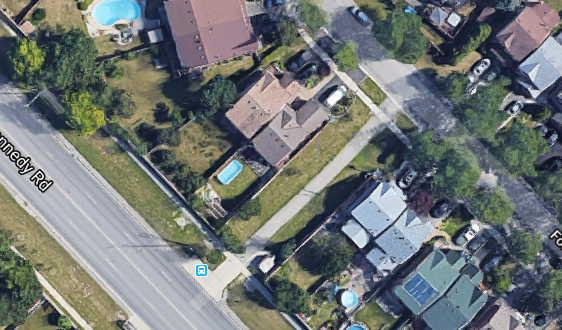
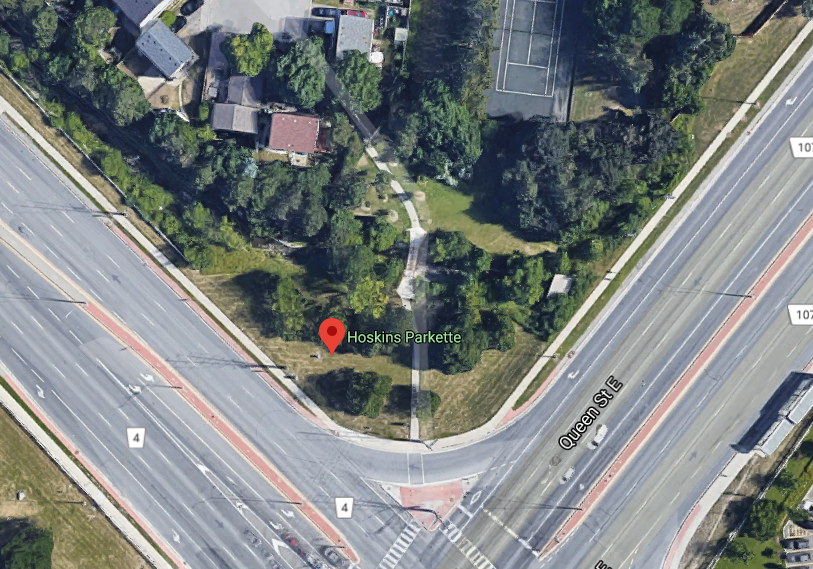
</div>
Here is a good example of a park
<div>
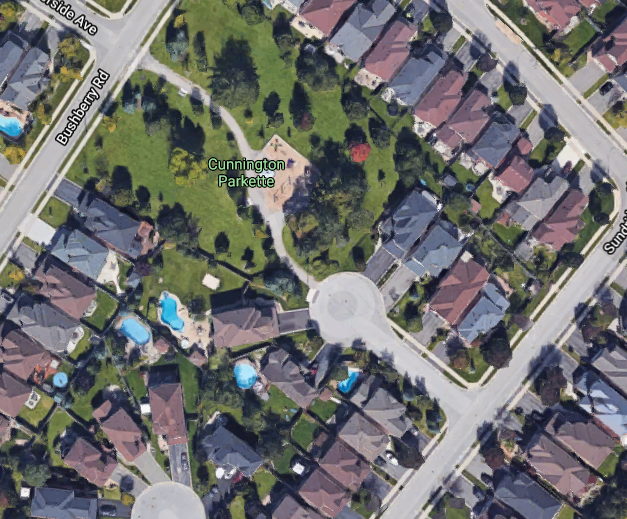
</div>
Note that it isn't a park just because of the swing set and sand box, these aren't necessary, but this example also includes free green space for any general recreation usage. 

Moving on to the Address Points dataset, which will be used to get coordinates for all the houses of Brampton.

In [11]:
address_df = pd.read_csv('Data/Address_Points.csv') # (City of Brampton, 2020)
# data retrieved from  Brampton's Open Data on geohub
# https://geohub.brampton.ca/datasets/address-points

C:\Users\Manveer\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (4,8,31) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [12]:
address_df.head()

,X,Y,OBJECTID,FULL_ADDRESS,UNIT_NO,CIVIC_NUMBER,STREET_NAME,STREET_TYPE,STREET_DIRECTION,CITY,...,REG_PLAN_NUMBER,REG_PLAN_ASSUMP_DATE,DRAFT_PLAN_NUMBER,SITE_PLAN_NUMBER,CONDO_PLAN_NUMBER,C_OF_A,CITY_FILE,BLOCK_PLAN,HERITAGE,GIS_ID
0,-8.885936e+06,5.420903e+06,1,4 ANSBURY DR,NaN,4,ANSBURY,DR,NaN,BRAMPTON,...,43M-1661,2011/12/14 00:00:00+00,NaN,NaN,NaN,NaN,C02W15.003-1,NaN,NaN,99072
1,-8.885952e+06,5.420909e+06,2,6 ANSBURY DR,NaN,6,ANSBURY,DR,NaN,BRAMPTON,...,43M-1661,2011/12/14 00:00:00+00,NaN,NaN,NaN,NaN,C02W15.003-1,NaN,NaN,99073
2,-8.885969e+06,5.420916e+06,3,8 ANSBURY DR,NaN,8,ANSBURY,DR,NaN,BRAMPTON,...,43M-1661,2011/12/14 00:00:00+00,NaN,NaN,NaN,NaN,C02W15.003-1,NaN,NaN,99074
3,-8.884677e+06,5.418626e+06,4,142 BONISTEL CRES,NaN,142,BONISTEL,CRES,NaN,BRAMPTON,...,43M-1578,2010/12/15 00:00:00+00,21T-98035B,NaN,NaN,NaN,C02W12.002,NaN,NaN,97393
4,-8.885805e+06,5.416323e+06,5,21 LEAGATE ST,NaN,21,LEAGATE,ST,NaN,BRAMPTON,...,43M-1440,2006/12/13 00:00:00+00,21T-98023B,NaN,NaN,NaN,C03W11.001,NaN,NaN,99521


In [13]:
#removing redundant columns, THERE ARE A LOT
address_df.drop(axis = 1, labels = ["OBJECTID", "UNIT_NO", "CIVIC_NUMBER", "STREET_NAME", "STREET_TYPE", "STREET_DIRECTION", 
                                    "CITY", "OBJECTID", "PROVINCE", "PROP_CODE_DESC", "PERMIT_NO", "SUB_TYPE", 
                                    "WORK_TYPE", "PERMIT_ISSUEDATE", "OCCUPANCY_DATE", "ADDRESS_TYPE", "ADDRESS_ID", 
                                    "TOWNSHIP", "LOT_NUM", "CON_NUM", "CITY_GRID", "SEC_PLAN_AREA", "REG_PLAN_NUMBER", 
                                    "REG_PLAN_ASSUMP_DATE", "DRAFT_PLAN_NUMBER", "SITE_PLAN_NUMBER", "CONDO_PLAN_NUMBER",
                                    "C_OF_A", "CITY_FILE", "BLOCK_PLAN", "HERITAGE", "GIS_ID"], inplace = True)
address_df.head()

,X,Y,FULL_ADDRESS,POSTAL_CODE,PERMIT_TYPE,WARD
0,-8.885936e+06,5.420903e+06,4 ANSBURY DR,L7A3S8,Repeat Residential,6.0
1,-8.885952e+06,5.420909e+06,6 ANSBURY DR,L7A3S8,NaN,6.0
2,-8.885969e+06,5.420916e+06,8 ANSBURY DR,L7A3S8,Repeat Residential,6.0
3,-8.884677e+06,5.418626e+06,142 BONISTEL CRES,L7A3H1,Repeat Residential,6.0
4,-8.885805e+06,5.416323e+06,21 LEAGATE ST,L7A1Z7,Repeat Residential,6.0


In [14]:
address_df["PERMIT_TYPE"].value_counts(dropna = False)

NaN                                     132438
Repeat Residential                       78997
Commercial                                2672
Industrial                                 518
House                                      307
Institutional                              226
Residential                                185
Commercial Finish Live Work                100
Residential Finish Live Work                30
Miscellaneous Industrial Plumbing            2
Miscellaneous Institutional Plumbing         1
House Miscellaneous Plumbing                 1
Miscellaneous Residential                    1
Name: PERMIT_TYPE, dtype: int64

Unfortunately there seem to be too many NaN values (NaN values seem to represent a lack of classification), regardless, everything that isn't Residential or NaN can be dropped. This means that inevitably there will be address points leftover that are not houses. Regardless, I am not prepared to manually go through 200,000 or so address points to determine whether or not they are houses. Manually going through the parks dataset took almost 3 days🙁😫.

In [15]:
address_df = address_df[address_df.PERMIT_TYPE != "Commercial"]
address_df = address_df[address_df.PERMIT_TYPE != "Industrial"]
address_df = address_df[address_df.PERMIT_TYPE != "Institutional"]
address_df = address_df[address_df.PERMIT_TYPE != "Commercial Finish Live Work"]
address_df = address_df[address_df.PERMIT_TYPE != "Miscellaneous Industrial Plumbing"]
address_df = address_df[address_df.PERMIT_TYPE != "House Miscellaneous Plumbing"]
address_df = address_df[address_df.PERMIT_TYPE != "Miscellaneous Residential"]
address_df = address_df[address_df.PERMIT_TYPE != "Miscellaneous Institutional Plumbing"]
# also found some rows have an address of unassigned or empty, i dropped these values
address_df = address_df[address_df.FULL_ADDRESS != "UNASSIGNED"]
address_df.dropna(subset=['FULL_ADDRESS'], inplace = True)

In [16]:
address_df["PERMIT_TYPE"].value_counts(dropna = False)

NaN                             118332
Repeat Residential               78992
House                              307
Residential                        185
Residential Finish Live Work        30
Name: PERMIT_TYPE, dtype: int64

In [17]:
address_df.shape

(197846, 6)

The Address Points dataset had coordinates for each row in WGS84 format that I was able to convert to latitude,longitude coordinates for ease of use.

In [18]:
def x_to_lon(row):
    x = row['X']
    return (x / 20037508.34) * 180
def y_to_lat(row):
    y = row['Y']
    return 180 / math.pi * (2 * math.atan(math.exp((y / 20037508.34) * math.pi)) - math.pi / 2)

address_df['Latitude'] = address_df.apply(y_to_lat, axis = 1)
address_df['Longitude'] = address_df.apply(x_to_lon, axis = 1)

In [19]:
address_df.drop(axis = 1, labels = ['X', 'Y'], inplace = True)

Can now compute the distance to the closest park for each address point.

In [20]:
address_df.head()

,FULL_ADDRESS,POSTAL_CODE,PERMIT_TYPE,WARD,Latitude,Longitude
0,4 ANSBURY DR,L7A3S8,Repeat Residential,6.0,43.711492,-79.823719
1,6 ANSBURY DR,L7A3S8,NaN,6.0,43.711533,-79.823863
2,8 ANSBURY DR,L7A3S8,Repeat Residential,6.0,43.711575,-79.824015
3,142 BONISTEL CRES,L7A3H1,Repeat Residential,6.0,43.696703,-79.812413
4,21 LEAGATE ST,L7A1Z7,Repeat Residential,6.0,43.681749,-79.822541


In [21]:
address_df.shape

(197846, 6)

In [22]:
# in miles
def coord_distance(lat1, lon1, lat2, lon2):
    MILES = 3959
    lat1, lon1, lat2, lon2 = map(np.deg2rad, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2) ** 2
    c = 2 * np.arcsin(np.sqrt(a))
    total_miles = MILES * c
    return total_miles

In [23]:
def find_shortest_dist_to_park(address):
    return coord_distance(address["Latitude"], address["Longitude"], parks_df["Latitude"], parks_df["Longitude"]).min()

This takes a very long time because for all of the 200,000 or so address points, need to find the closest distance to one of the 700 or so parks

In [24]:
#address_df['nearest_park_distance'] = address_df.apply(find_shortest_dist_to_park, axis = 1)
#address_df['nearest_park_distance'] = address_df['nearest_park_distance'] * 1.60934 # converting to kilometers
#address_df.to_csv('Addresses_with_park_distance_calculated.csv')

To avoid having to recompute the above and losing time, I wrote the result to a csv file 

In [25]:
address_df = pd.read_csv('Data/Addresses_with_park_distance_calculated.csv')
address_df.drop(labels = ['Unnamed: 0'], axis = 1, inplace = True)

In [26]:
address_df.head()

,FULL_ADDRESS,POSTAL_CODE,PERMIT_TYPE,WARD,Latitude,Longitude,nearest_park_distance
0,4 ANSBURY DR,L7A3S8,Repeat Residential,6.0,43.711492,-79.823719,0.177782
1,6 ANSBURY DR,L7A3S8,NaN,6.0,43.711533,-79.823863,0.169235
2,8 ANSBURY DR,L7A3S8,Repeat Residential,6.0,43.711575,-79.824015,0.160937
3,142 BONISTEL CRES,L7A3H1,Repeat Residential,6.0,43.696703,-79.812413,0.262320
4,21 LEAGATE ST,L7A1Z7,Repeat Residential,6.0,43.681749,-79.822541,0.232539


Finally, can now begin analysis

In [27]:
address_df['nearest_park_distance'].describe()

count    197846.000000
mean          0.260513
std           0.174081
min           0.000318
25%           0.154509
50%           0.227013
75%           0.318063
max           4.022115
Name: nearest_park_distance, dtype: float64

There are of course 3 major sources of error.
1. Using coordinates means that both parks and houses are treated as single points, rather than large areas.
2. Distance numbers are misleading to citizens because although a park might be some distance away, this is a point-to-point distance and does not represent the distance that a citizen would have to walk to get to a park from their house (sidewalks do not exist as straight paths from house to park).
3. As mentioned earlier, many of the address points used are not necessarily residential address points, but they nonetheless are assumed to represent houses.


On average, I found the address points considered are about 261 meters away from a park. And 75% of address points considered are less than 318 meters away from a park. Of course, the smaller the numbers the better, but these numbers seem reasonable. Taking a look at a histogram of how far the address points considered are from their closest park:

Text(0, 0.5, 'Number of Houses')

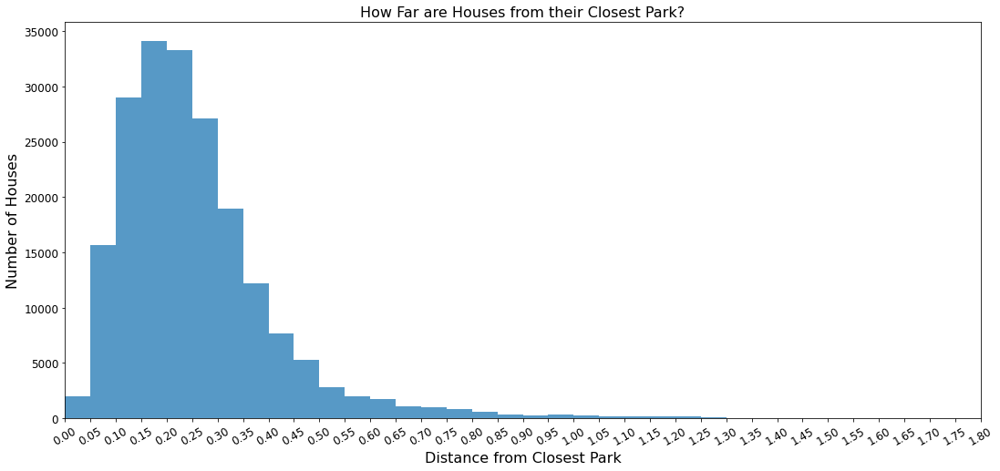

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rc('xtick', labelsize=12)    # fontsize of the tick labels
plt.rc('ytick', labelsize=12)    # fontsize of the tick labels

bin_edges = np.linspace(0.0, 1.8, 37)
address_df['nearest_park_distance'].plot(kind = 'hist', figsize = (18, 8), xticks=bin_edges, bins = bin_edges, xlim=(0, 1.8),
                                        alpha=0.75, rot=30)

plt.title('How Far are Houses from their Closest Park?', fontsize = 16)
plt.xlabel("Distance from Closest Park", fontsize = 16)
plt.ylabel("Number of Houses", fontsize = 16)

There seem to be many address points that are a sufficiently small distance away from a park (again though, the smaller the better). However, one thing to note in the histogram is the steady decline in frequency after the peak. There are many address points in the analysis that are disproportionately far from a park and this needs to be further looked into.

In [29]:
from sklearn.cluster import KMeans
kmeans_clusters = KMeans(n_clusters=4).fit(address_df[['nearest_park_distance']])

I decided to use K Means clustering to group the address points by how far away they are from the nearest park. I used 4 clusters to group the address points. I then took a closer look at the cluster with address points furthest away from the nearest park. I would like to point out that it is also fruitful to look at the second cluster with address points furthest away from the nearest park. I carefully looked at one to show how the data can be used to inform decisions. 

In [30]:
kmeans_clusters.cluster_centers_

array([[0.14988001],
       [0.30340891],
       [0.5563574 ],
       [1.18442269]])

In [31]:
address_df['cluster'] = kmeans_clusters.predict(address_df[['nearest_park_distance']])

In [32]:
address_df.head()

,FULL_ADDRESS,POSTAL_CODE,PERMIT_TYPE,WARD,Latitude,Longitude,nearest_park_distance,cluster
0,4 ANSBURY DR,L7A3S8,Repeat Residential,6.0,43.711492,-79.823719,0.177782,0
1,6 ANSBURY DR,L7A3S8,NaN,6.0,43.711533,-79.823863,0.169235,0
2,8 ANSBURY DR,L7A3S8,Repeat Residential,6.0,43.711575,-79.824015,0.160937,0
3,142 BONISTEL CRES,L7A3H1,Repeat Residential,6.0,43.696703,-79.812413,0.262320,1
4,21 LEAGATE ST,L7A1Z7,Repeat Residential,6.0,43.681749,-79.822541,0.232539,1


In [33]:
import heapq
max_cluster_nums = heapq.nlargest(2, range(len(kmeans_clusters.cluster_centers_)), kmeans_clusters.cluster_centers_.__getitem__)

In [34]:
farthest_houses = address_df.loc[address_df['cluster'] == max_cluster_nums[0]]

In [35]:
farthest_houses['nearest_park_distance'].describe()

count    2356.000000
mean        1.183225
std         0.396271
min         0.870403
25%         0.962339
50%         1.058593
75%         1.211814
max         4.022115
Name: nearest_park_distance, dtype: float64

The cluster with address points furthest away from a park had address points an average of 1.19 kilometers away from the nearest park. Keep in mind that even if a park is 1.18 kilometers away, it will inevitably be a significantly longer walk to get there because paths rarely run in a straight line from an arbitrary point A to an arbitrary point B.

In [36]:
import folium

In [37]:
map_farthest_houses = folium.Map(location=[43.719126, -79.756104], zoom_start=11)

# add markers to map
for lat, lng, address in zip(farthest_houses['Latitude'], farthest_houses['Longitude'], farthest_houses['FULL_ADDRESS']):
    label = '{}'.format(address)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_farthest_houses)  
    
map_farthest_houses

Taking a look at the map above, we can pick up on a few things. The first thing to note is that most of the address points far away from parks are on the outskirts of Brampton. This can be explained away by the fact that since the data is looking at Brampton's parks only, the outskirts of Brampton will be affected the most.  

Taking a look at the highlighted groups of houses.
<div>
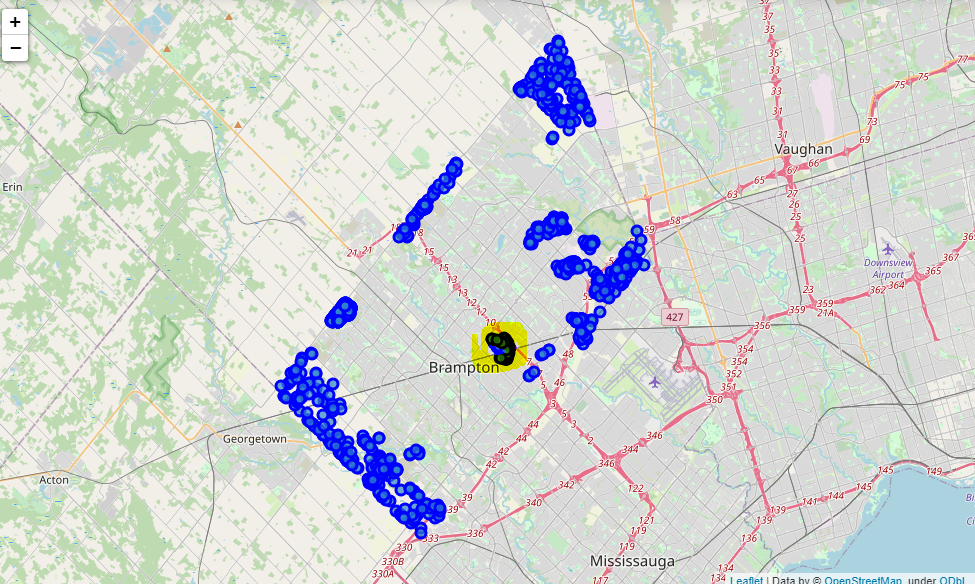
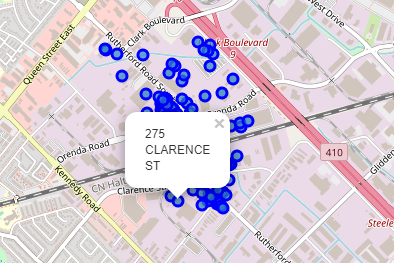
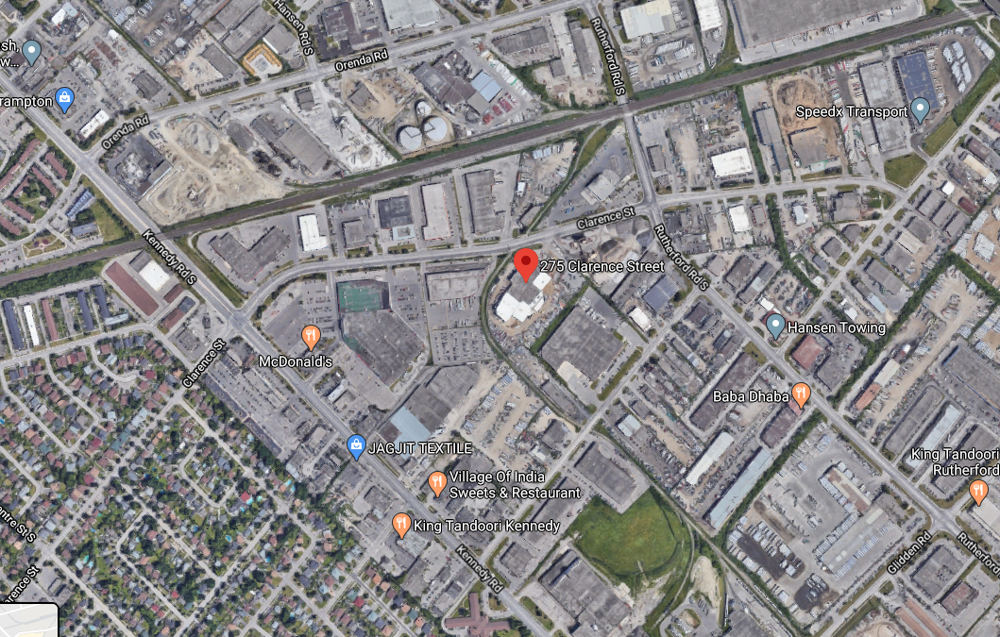
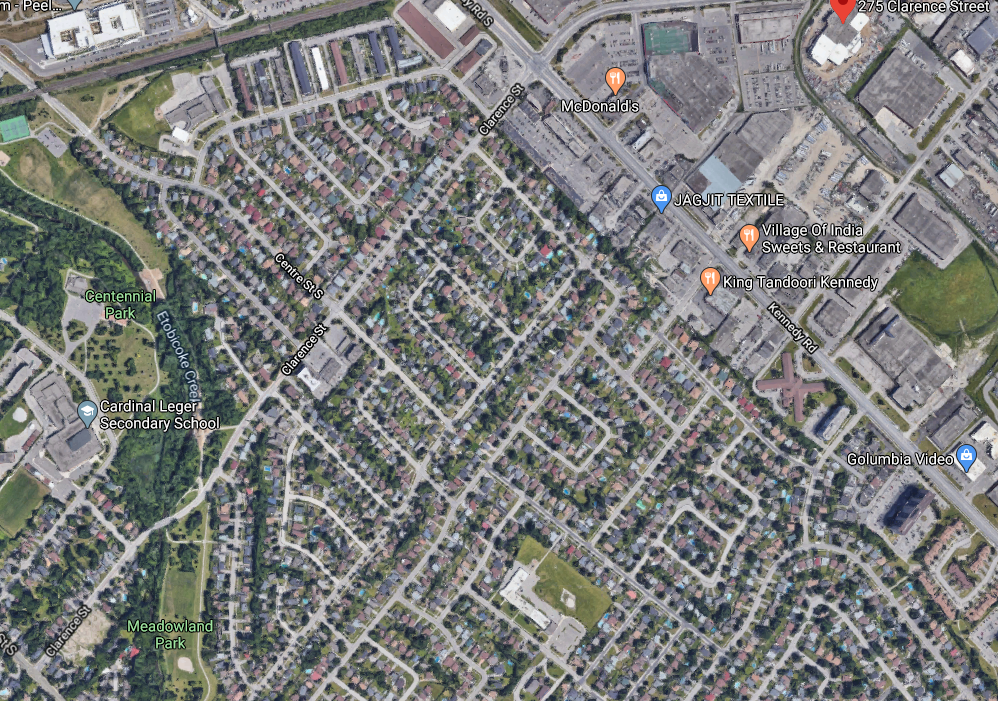
</div>

It seems that the actual points of the cluster are not all houses. Regardless, the area is a problem area because of a lack of parks. It is important to recognize these areas and provide solutions for their residents. The nearby houses live in an ugly area looking through the lens of proximity to parks. I recognize that there is the Etobicoke Creek trail nearby with its parks, but many of the residents here face an almost 2km walk through endless houses to get to any sort of real greenery. It seems to be difficult to add any parks because of the densely built houses and buildings. City planners should look to add greenery to what looks like a grey mess from the satellite view.  Repurposing some of the space for recreation, a targeted gardening program, or having initiatives for better lawns for the people who live here could be fruitful endeavours.

I hope that through this sort of analysis, citizens of Brampton can be better provided with essential outdoor recreation space.

## Citations
   
City of Brampton. (2020). *Address Points*. Retrieved May 15, 2020 from https://geohub.brampton.ca/datasets/address-points   
   
City of Brampton. (2020). *Parks*. Retrieved May 10, 2020 from https://geohub.brampton.ca/datasets/parks
   
Glazier, R.H., Booth, G. L., Dunn, J. R., Polsky, J. Y., Weyman, J. T., Tynan, A. M., Creatore, M. I., Gozdyra, P. (2014). *Diabetes Atlas for the Region of Peel*. Peel Public Health. Retrieved May 7, 2020 from https://www.peelregion.ca/health/resources/diabetes-atlas/full-report.pdf
    
Oregon State University. (2005). Study Links Obesity, Urban Sprawl. *ScienceDaily*. Retrieved May 7, 2020 from www.sciencedaily.com/releases/2005/09/050909220354.htm
    
Sturm, R., & Cohen, D. (2014). Proximity to urban parks and mental health. *The journal of mental health policy and economics*, 17(1), 19–24.